# Problem Statement

Context
Business communities in the United States are facing high demand for human resources, but one of the constant challenges is identifying and attracting the right talent, which is perhaps the most important element in remaining competitive. Companies in the United States look for hard-working, talented, and qualified individuals both locally as well as abroad.

The Immigration and Nationality Act (INA) of the US permits foreign workers to come to the United States to work on either a temporary or permanent basis. The act also protects US workers against adverse impacts on their wages or working conditions by ensuring US employers' compliance with statutory requirements when they hire foreign workers to fill workforce shortages. The immigration programs are administered by the Office of Foreign Labor Certification (OFLC).

OFLC processes job certification applications for employers seeking to bring foreign workers into the United States and grants certifications in those cases where employers can demonstrate that there are not sufficient US workers available to perform the work at wages that meet or exceed the wage paid for the occupation in the area of intended employment.

Objective
In FY 2016, the OFLC processed 775,979 employer applications for 1,699,957 positions for temporary and permanent labor certifications. This was a nine percent increase in the overall number of processed applications from the previous year. The process of reviewing every case is becoming a tedious task as the number of applicants is increasing every year.

The increasing number of applicants every year calls for a Machine Learning based solution that can help shortlist candidates with higher chances of VISA approval. OFLC has hired the firm EasyVisa for data-driven solutions. You as a data scientist at EasyVisa have to analyze the data provided and, with the help of a classification model:

Facilitate the process of visa approvals.
Recommend a suitable profile for the applicants for whom the visa should be certified or denied based on the drivers that significantly influence the case status.

Data Description
The data contains the different attributes of the employee and the employer. The detailed data dictionary is given below.

case_id: ID of each visa application
continent: Information of continent the employee
education_of_employee: Information of education of the employee
has_job_experience: Does the employee have any job experience? Y= Yes; N = No
requires_job_training: Does the employee require any job training? Y = Yes; N = No
no_of_employees: Number of employees in the employer's company
yr_of_estab: Year in which the employer's company was established
region_of_employment: Information of foreign worker's intended region of employment in the US.
prevailing_wage: Average wage paid to similarly employed workers in a specific occupation in the area of intended employment. The purpose of the prevailing wage is to ensure that the foreign worker is not underpaid compared to other workers offering the same or similar service in the same area of employment.
unit_of_wage: Unit of prevailing wage. Values include Hourly, Weekly, Monthly, and Yearly.
full_time_position: Is the position of work full-time? Y = Full-Time Position; N = Part-Time Position
case_status: Flag indicating if the Visa was certified or denied

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report


from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import make_pipeline

from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN


import warnings
warnings.filterwarnings("ignore")

# Exploratory Data Analysis

## Read and Load the dataframe

In [2]:
visa_df = pd.read_csv(r"C:\Users\vijay\Downloads\EasyVisa.csv")

## Display the shape of the dataframe

In [3]:
visa_df.shape

(25480, 12)

## Check 5-point summary of the new DataFrame

In [4]:
visa_df.describe()

,no_of_employees,yr_of_estab,prevailing_wage
count,25480.000000,25480.000000,25480.000000
mean,5667.043210,1979.409929,74455.814592
std,22877.928848,42.366929,52815.942327
min,-26.000000,1800.000000,2.136700
25%,1022.000000,1976.000000,34015.480000
50%,2109.000000,1997.000000,70308.210000
75%,3504.000000,2005.000000,107735.512500
max,602069.000000,2016.000000,319210.270000


## Get Datatype info of the columns

In [5]:
visa_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25480 entries, 0 to 25479
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   case_id                25480 non-null  object 
 1   continent              25480 non-null  object 
 2   education_of_employee  25480 non-null  object 
 3   has_job_experience     25480 non-null  object 
 4   requires_job_training  25480 non-null  object 
 5   no_of_employees        25480 non-null  int64  
 6   yr_of_estab            25480 non-null  int64  
 7   region_of_employment   25480 non-null  object 
 8   prevailing_wage        25480 non-null  float64
 9   unit_of_wage           25480 non-null  object 
 10  full_time_position     25480 non-null  object 
 11  case_status            25480 non-null  object 
dtypes: float64(1), int64(2), object(9)
memory usage: 2.3+ MB


## Converting OBJECT datatype to Categorical (for memory efficiency and performance imporvement over strings)


 The datatype objects are now converted to Categorical as shown below

In [6]:
for feature in visa_df.columns:
    if visa_df[feature].dtype == 'object':
        visa_df[feature] = pd.Categorical(visa_df[feature])      

In [7]:
visa_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25480 entries, 0 to 25479
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   case_id                25480 non-null  category
 1   continent              25480 non-null  category
 2   education_of_employee  25480 non-null  category
 3   has_job_experience     25480 non-null  category
 4   requires_job_training  25480 non-null  category
 5   no_of_employees        25480 non-null  int64   
 6   yr_of_estab            25480 non-null  int64   
 7   region_of_employment   25480 non-null  category
 8   prevailing_wage        25480 non-null  float64 
 9   unit_of_wage           25480 non-null  category
 10  full_time_position     25480 non-null  category
 11  case_status            25480 non-null  category
dtypes: category(9), float64(1), int64(2)
memory usage: 2.0 MB


## Print Feature-wise percentage of Null values

The following code gives percentage of NULL values (if any) amongst all the features.


In [8]:
# Calculate percentage of null values for each feature in normal_df
normal_null_percentage = visa_df.isnull().mean() * 100
print("Percentage of null values in visa_df:")
print(normal_null_percentage)

Percentage of null values in visa_df:
case_id                  0.0
continent                0.0
education_of_employee    0.0
has_job_experience       0.0
requires_job_training    0.0
no_of_employees          0.0
yr_of_estab              0.0
region_of_employment     0.0
prevailing_wage          0.0
unit_of_wage             0.0
full_time_position       0.0
case_status              0.0
dtype: float64


## Representation of the same in heat map for better visualization

<Axes: >

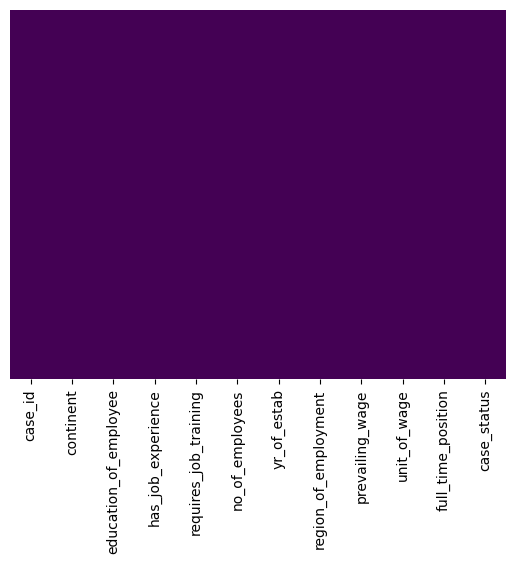

In [9]:
sns.heatmap(visa_df.isnull(), yticklabels=False, cbar=False, cmap="viridis")

In [10]:
visa_df.head()

,case_id,continent,education_of_employee,has_job_experience,requires_job_training,no_of_employees,yr_of_estab,region_of_employment,prevailing_wage,unit_of_wage,full_time_position,case_status
0,EZYV01,Asia,High School,N,N,14513,2007,West,592.2029,Hour,Y,Denied
1,EZYV02,Asia,Master's,Y,N,2412,2002,Northeast,83425.6500,Year,Y,Certified
2,EZYV03,Asia,Bachelor's,N,Y,44444,2008,West,122996.8600,Year,Y,Denied
3,EZYV04,Asia,Bachelor's,N,N,98,1897,West,83434.0300,Year,Y,Denied
4,EZYV05,Africa,Master's,Y,N,1082,2005,South,149907.3900,Year,Y,Certified


## Visualize a heatmap to understand correlation between all features

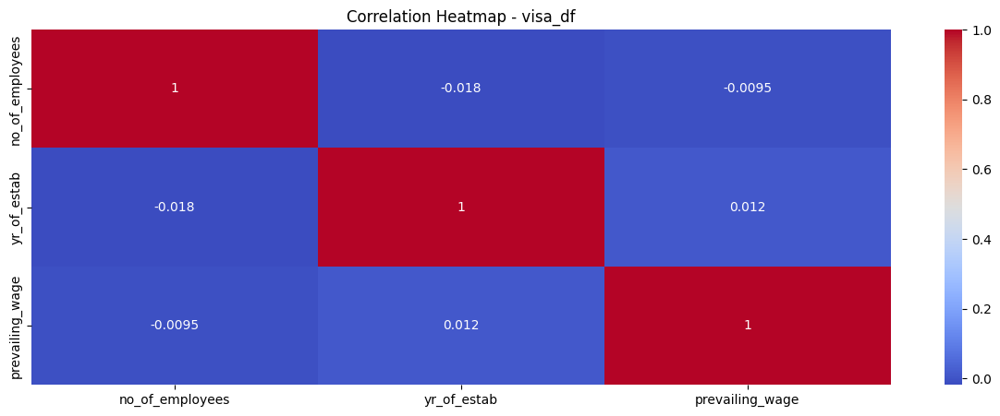

In [11]:
numeric_columns = ['no_of_employees', 'yr_of_estab', 'prevailing_wage']

# Set up the figure and single axis
fig, ax = plt.subplots(1, 1, figsize=(15, 5))

# Plot heatmap for normal_df
sns.heatmap(visa_df[numeric_columns].corr(), annot=True, cmap='coolwarm', ax=ax)
ax.set_title('Correlation Heatmap - visa_df')

# Show the plot
plt.show()

The number of employees is strongly correlated with the year of establishment, implying older companies tend to have more employees.

The number of employees and prevailing wage have a negligible relationship.

The year of establishment and prevailing wage also have a minimal relationship.

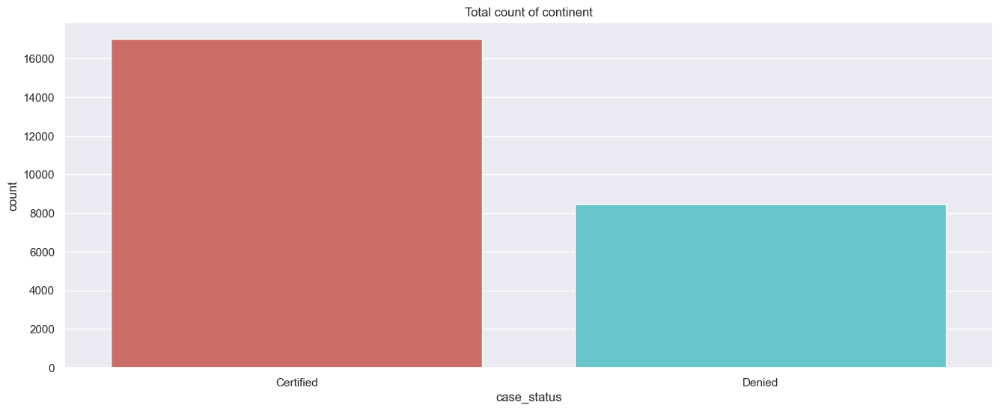

In [12]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="case_status", data=visa_df, palette="hls").set(title='Total count of continent')

In [13]:
visa_df['case_status'].value_counts(normalize=True) * 100

case_status
Certified    66.789639
Denied       33.210361
Name: proportion, dtype: float64

There are a lot more people in the "Certified" group than the "Denied" group.

Overall, the graph provides a clear visual representation of the imbalance between certified and denied cases in the dataset.

This dataset consist of approximately 66% of Certified visa case status as opposed to rejected / denied that stands at approximately 33%.

## Check the feature distribution / counts of column "unit_of_wage"

In [14]:
visa_df["unit_of_wage"].value_counts()

unit_of_wage
Year     22962
Hour      2157
Week       272
Month       89
Name: count, dtype: int64

### 1) What unit of wage is common across the continents? How does that affect?

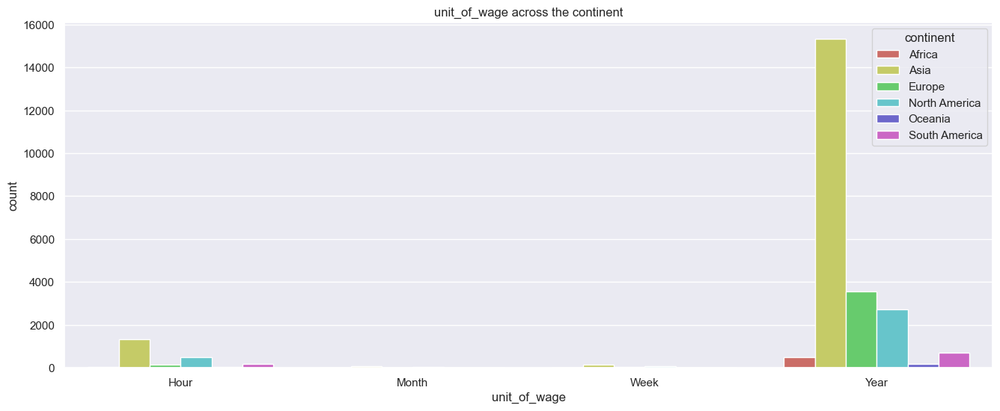

In [15]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="unit_of_wage", hue= "continent", data=visa_df, palette="hls").set(title='unit_of_wage across the continent')

There are significant differences in wage units between continents, with regions like Europe and North America leaning towards monthly wages, while Africa and Asia primarily use hourly wages.

The most common unit of wage across all continents is Yearly, indicating a global preference for this pay structure.

The column "prevailing_wage" is converted to Yearly for further calculation as shown below


In [16]:
hours_per_week = 40
weeks_per_year = 52
months_per_year = 12
hours_to_annual = hours_per_week * weeks_per_year
weeks_to_annual = weeks_per_year
months_to_annual = months_per_year

# Convert hourly, weekly, and monthly wages to annual wages
visa_df.loc[visa_df['unit_of_wage'] == 'Hour', 'prevailing_wage'] *= hours_to_annual
visa_df.loc[visa_df['unit_of_wage'] == 'Week', 'prevailing_wage'] *= weeks_to_annual
visa_df.loc[visa_df['unit_of_wage'] == 'Month', 'prevailing_wage'] *= months_to_annual

# Update all units to 'Year' for consistency
visa_df['unit_of_wage'] = 'Year'

In [17]:
visa_df["unit_of_wage"].value_counts()

unit_of_wage
Year    25480
Name: count, dtype: int64

_________________________

### 2) How does the prevailing wage affect visa approval rates?

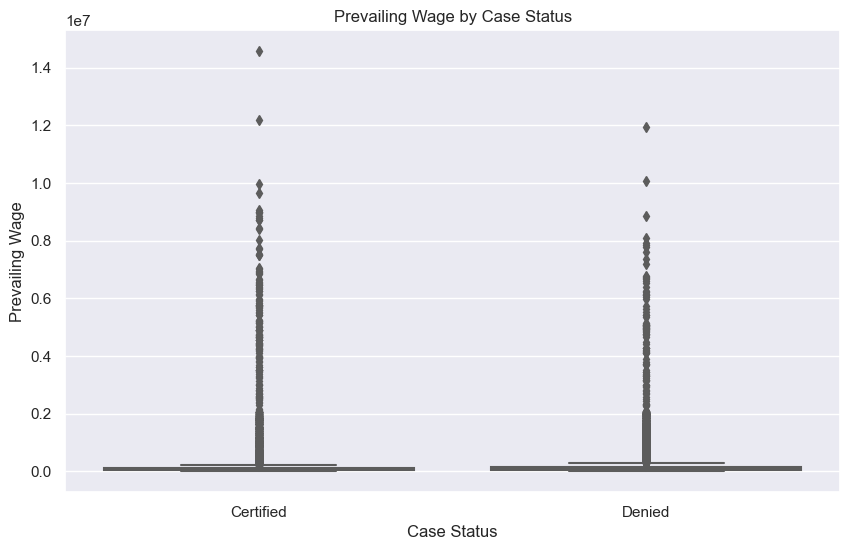

In [28]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='case_status', y='prevailing_wage', data=visa_df, palette='hls')
plt.title('Prevailing Wage by Case Status')
plt.xlabel('Case Status')
plt.ylabel('Prevailing Wage')
plt.show()

The median wage for "Certified" cases is higher than for "Denied" cases.

Wages for "Certified" cases show more variability than for "Denied" cases.

Both "Certified" and "Denied" cases have many extreme values (outliers).

Wages for both "Certified" and "Denied" cases tend to be higher but with fewer occurrences (right-skewed distribution).

Generally, "Certified" cases have higher prevailing wages than "Denied" cases.

There doesn't seem to be much significance for selection or rejection of Visa based on wages alone

### 3) What is the distribution of visa applications across different continents?

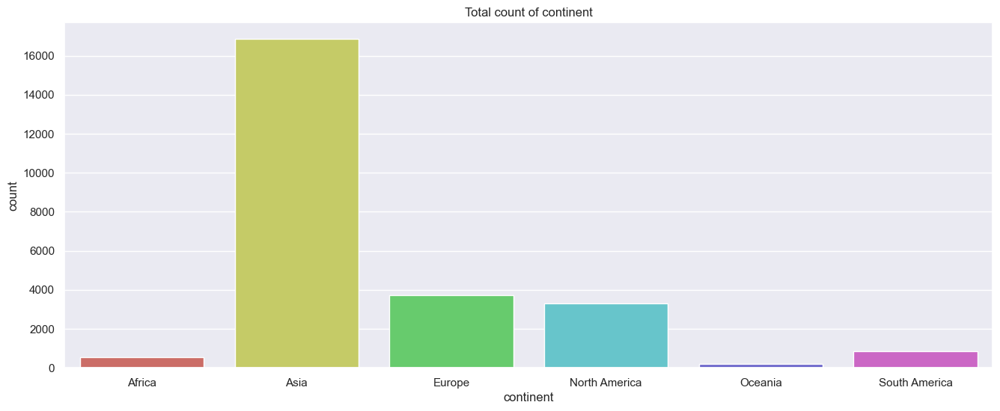

In [18]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="continent", data=visa_df, palette="hls").set(title='Total count of continent')

The dataset predominantly consists of people from the Asia region. 

Based on the given dataset, it is impossible to identify specific countries within this category as such information does not exist. 

For individuals from the USA (North America), their first preference appears to be Asia, followed by Europe in second place.

### 4) How does the education level of employees affect visa approval rates?

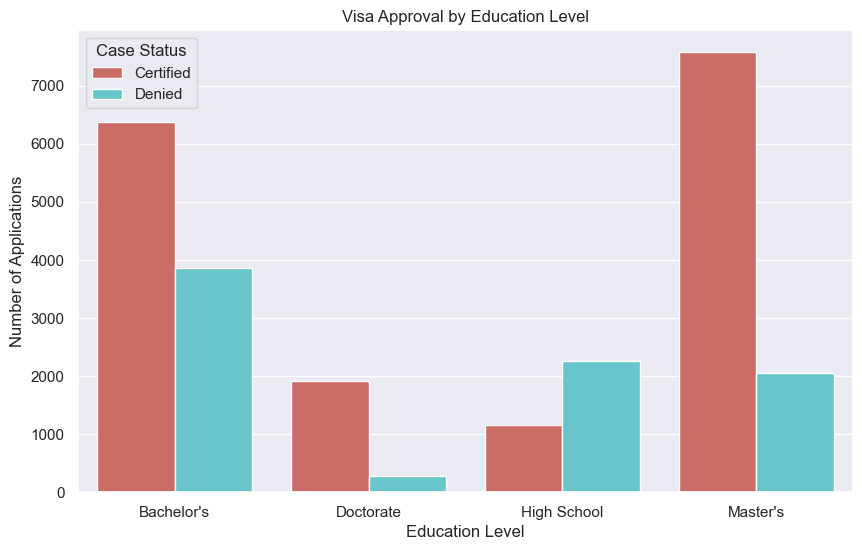

In [27]:
plt.figure(figsize=(10, 6))
sns.countplot(x='education_of_employee', hue='case_status', data=visa_df, palette='hls')
plt.title('Visa Approval by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Number of Applications')
plt.legend(title='Case Status')
plt.show()

It's clear from the graph that people with Masters degree have a higher preference for jobs.

However, people with Doctorate degree are less preferred and High scool Grads have a higher chance of rejection of Visa

### 5) How does the visa status vary across different continents?

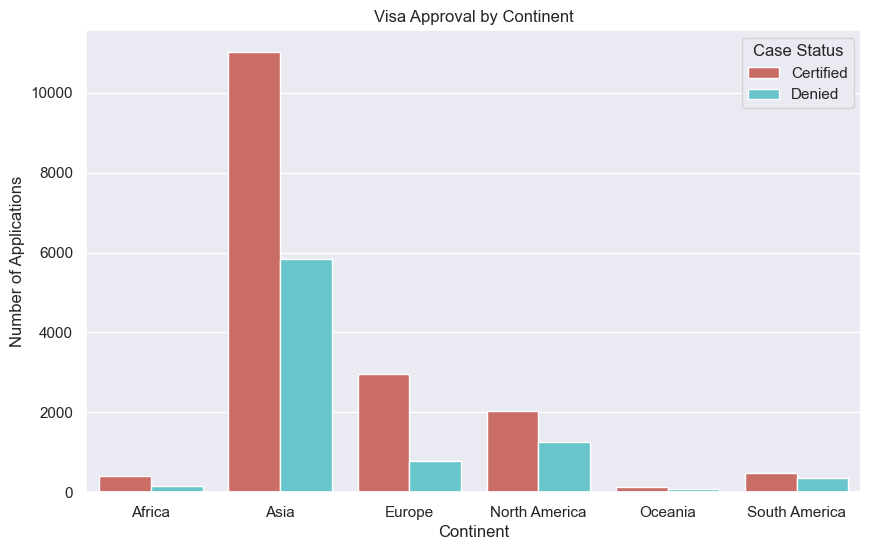

In [30]:
plt.figure(figsize=(10, 6))
sns.countplot(x='continent', hue='case_status', data=visa_df, palette='hls')
plt.title('Visa Approval by Continent')
plt.xlabel('Continent')
plt.ylabel('Number of Applications')
plt.legend(title='Case Status')
plt.show()

### 6) How does the type of employment speard across the continents?

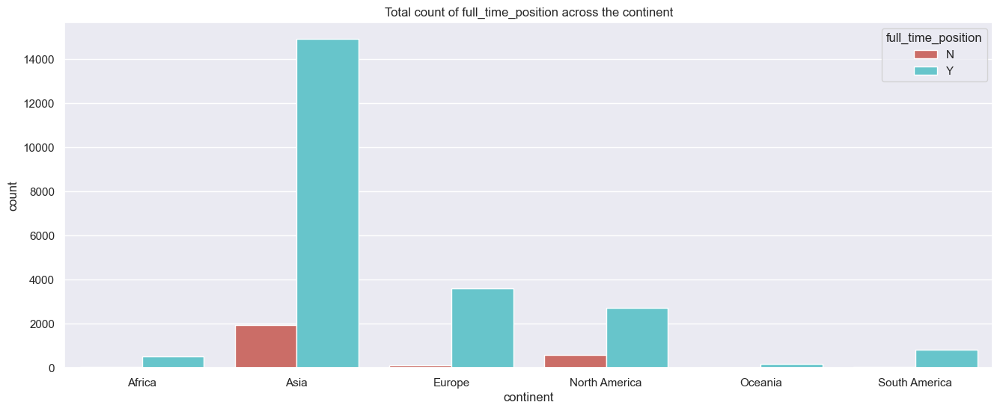

In [19]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="continent", hue= "full_time_position", data=visa_df, palette="hls").set(title='Total count of full_time_position across the continent')

Asia has the highest number of full-time positions, both available and unavailable.

Europe and North America have a significant number of full-time positions, with a higher proportion being available.

Africa, Oceania, and South America have relatively fewer full-time positions compared to Asia, Europe, and North America.

Overall, the graph shows that the availability of full-time positions varies across different continents, with Asia having the highest number and a mix of available and unavailable positions.

### 7) Does having job experince correlate with also the education of the employee?

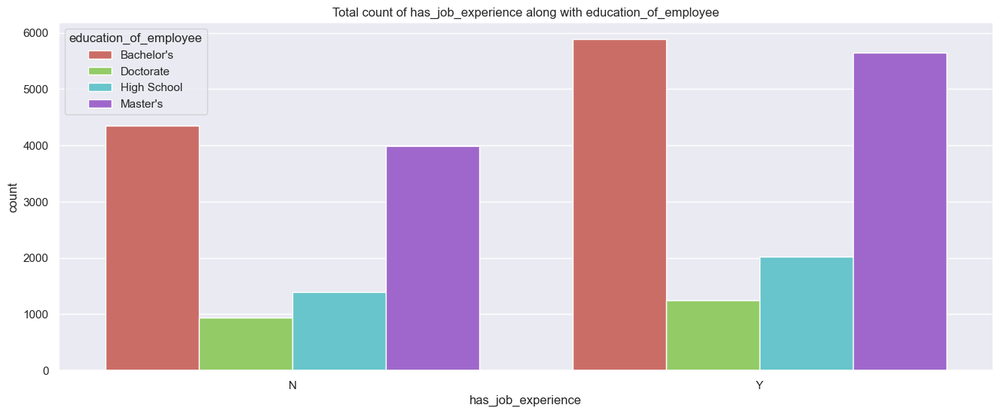

In [20]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="has_job_experience", hue= "education_of_employee", data=visa_df, palette="hls").set(title='Total count of has_job_experience along with education_of_employee')

More people with Bachelor's degrees have job experience ("Y") than those who don't ("N").

More people with Doctorate degrees have job experience ("Y") than those who don't ("N"), but the difference is less pronounced than for Bachelor's degrees.

More people with a High School education do not have job experience ("N") than those who do ("Y").

More people with Master's degrees have job experience ("Y") than those who don't ("N"), but the difference is less pronounced than for Bachelor's degrees.

Overall, higher education levels are generally associated with a higher likelihood of having job experience.

### 8) Does type of employment have some relaton to the region they are hired to?

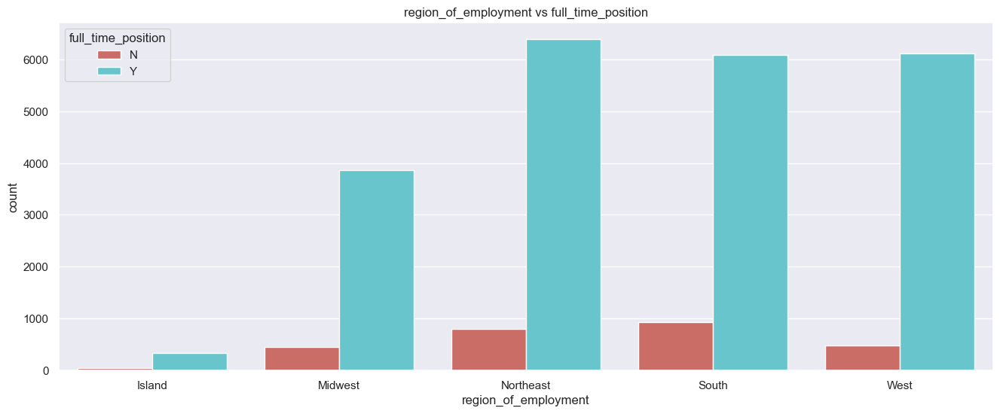

In [21]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="region_of_employment", hue= "full_time_position", data=visa_df, palette="hls").set(title='region_of_employment vs full_time_position')

The Northeast has the highest number of full-time positions, both available and unavailable.

The West has the second-highest number of full-time positions, both available and unavailable.

The South has a significant number of full-time positions, with a higher proportion being available.

The Midwest has a moderate number of full-time positions, with a higher proportion being unavailable.

The Island has the lowest number of full-time positions, both available and unavailable.

Overall, the availability of full-time positions varies across different regions, with the Northeast and West having the highest numbers and a mix of available and unavailable positions.

The graph only focuses on full-time positions. It would be interesting to see how other position types (e.g., part-time, contract) are distributed across regions.

### 9) Employess from what region have higher chances of getting visa approved?

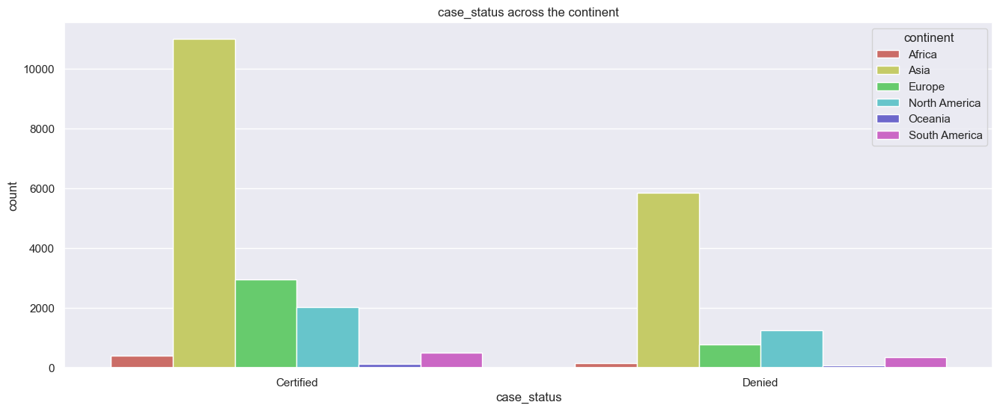

In [22]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="case_status", hue= "continent", data=visa_df, palette="hls").set(title='case_status across the continent')

Asia has the most cases, with many more certified than denied, while Africa and Oceania have fewer cases with slightly more certified than denied.

Europe and North America have a moderate number of cases, with more certified than denied.

South America has a low number of cases, with slightly more certified than denied.

The number and outcomes of cases vary by continent, often influenced by economic strength, government policies, and socio-economic factors.

Analyzing different types of cases and tracking changes over time can reveal important trends and patterns.

Understanding these factors can help improve policies, allocate resources effectively, and inform the public about the immigration process.

### 10) Does strong company presense i.e having more years of establishment drive the number of workforce?

[Text(0.5, 1.0, 'yr_of_estab vs no_of_employees at a company')]

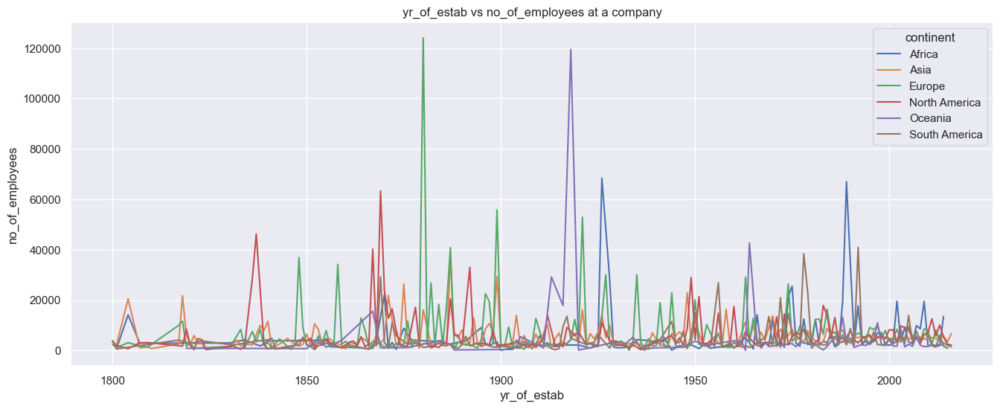

In [23]:
plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
sns.lineplot(data=visa_df, x="yr_of_estab", y="no_of_employees", hue="continent", ci=None).set(title='yr_of_estab vs no_of_employees at a company')

From the above graph, it appears the people from Eurpoe and Oceania countries tesnd to work at companies that are establied long back

Although from teh previous graphs, Asian employees have a large number of accesptance. It appears the longetivity of a company / year established may not be a crucial factor for them

Asia has the highest number of employees in recent years, with rapid growth in the last few decades.

Europe and North America have a significant number of employees, with steady growth over time.

Africa, Oceania, and South America have fewer employees compared to Asia, Europe, and North America, with varying growth patterns.

Overall, the number of employees in companies has increased over time, with significant differences across continents.

The graph lacks details on specific years, company sizes, and other factors like industry or economic conditions that could impact employee numbers.

### 11) Does regional companies have some influence or requirents of visa status?

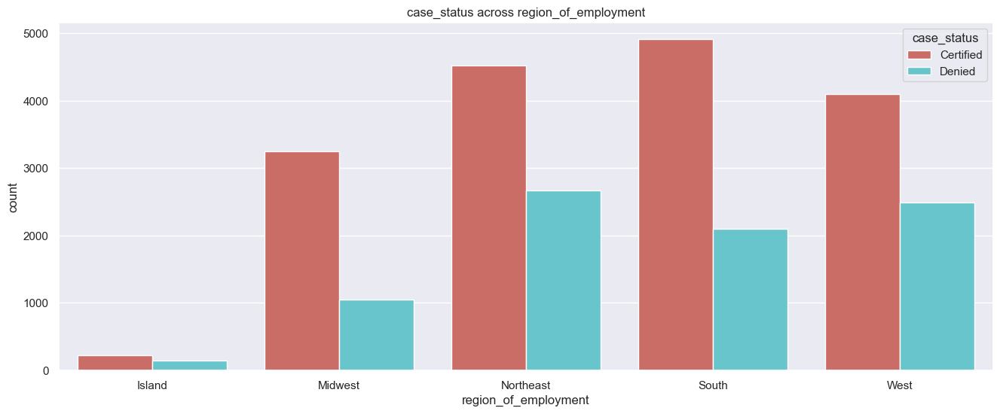

In [24]:

plt.figure(figsize=(16, 6))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="region_of_employment", hue= "case_status", data=visa_df, palette="hls").set(title='case_status across region_of_employment')

The Northeast has the highest number of both certified and denied cases, indicating a large volume of applications processed in this region.

The West also has a large number of certified cases, but it experiences a significant number of denied cases as well, showing a high level of application activity with varied outcomes.

The South has a good number of certified cases compared to denied cases, suggesting a relatively favorable approval rate for applications in this region.

The Midwest has fewer cases overall, with a mix of certified and denied, indicating moderate application activity and a balanced outcome ratio.

The Island region has the fewest cases, with a small number of both certified and denied, highlighting minimal application activity in this area.

The graph shows that the number of cases and their outcomes (certified or denied) vary across different regions. The Northeast has the highest overall number of cases, while the Island region has the fewest.

____________________

## Visualize a pairplot with 3 classes distinguished by colors and share insights

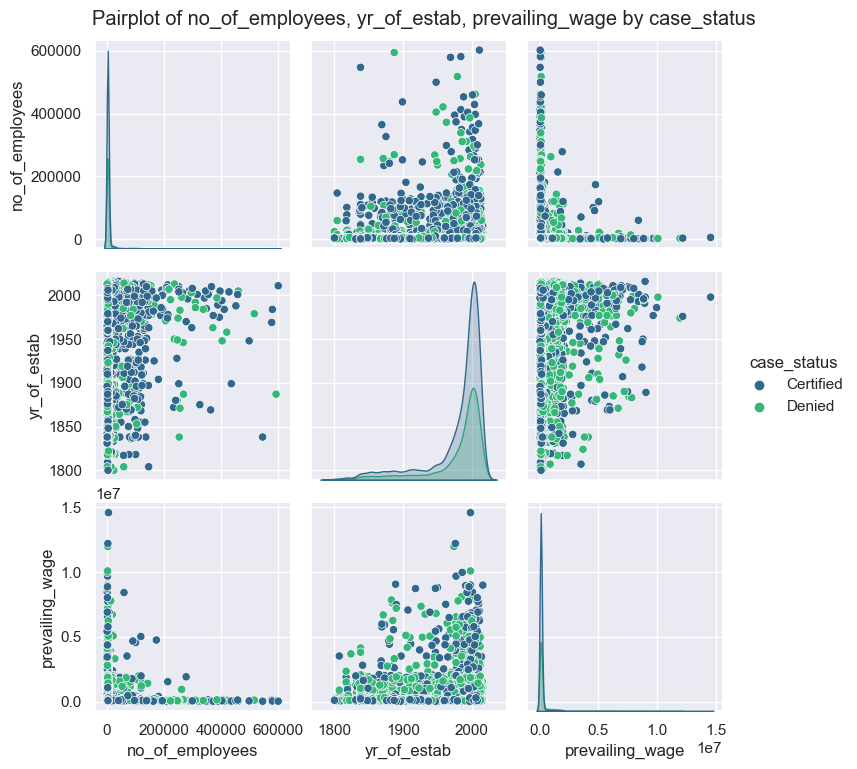

In [25]:
# Define the numeric columns for pairplot
numeric_columns = ['no_of_employees', 'yr_of_estab', 'prevailing_wage']

# Create pairplot with classes distinguished by colors
sns.pairplot(visa_df, vars=numeric_columns, hue='case_status', palette='viridis')
plt.suptitle('Pairplot of no_of_employees, yr_of_estab, prevailing_wage by case_status', y=1.02)
plt.show()

There is a positive relationship between the number of employees and the year of establishment, meaning older companies tend to have more employees.

There is a weak positive relationship between the number of employees and the prevailing wage, indicating that companies with more employees tend to offer slightly higher wages.

There is a weak positive relationship between the year of establishment and the prevailing wage, suggesting that older companies tend to offer slightly higher wages.

The distribution of "Certified" and "Denied" cases is similar across the subplots, suggesting that case status does not strongly impact the relationships between the variables.

The graph provides a visual overview of the relationships between the number of employees, year of establishment, prevailing wage, and case status.

____________________

________________________________

# Data Preprocessing

________________________________


### Encoding the dataset
##### I have used LabelEncoder as the data is categorical and is not ordinal in nature.
##### Also because, we have more than 9 columns, going with one hot encoding is not an ideal option.
##### The columns 'case_id', 'continent', 'education_of_employee', 'has_job_experience', 'requires_job_training', 'region_of_employment', 'unit_of_wage', 'full_time_position', 'case_status' would be converted as follows.

In [31]:
lab_enc = LabelEncoder()

# Fit and transform the columns
visa_df["case_id"] = lab_enc.fit_transform(visa_df["case_id"])
case_id_mapping = dict(zip(lab_enc.transform(lab_enc.classes_), lab_enc.classes_))

visa_df["continent"] = lab_enc.fit_transform(visa_df["continent"])
continent_mapping = dict(zip(lab_enc.transform(lab_enc.classes_), lab_enc.classes_))

visa_df["education_of_employee"] = lab_enc.fit_transform(visa_df["education_of_employee"])
education_mapping = dict(zip(lab_enc.transform(lab_enc.classes_), lab_enc.classes_))

visa_df["has_job_experience"] = lab_enc.fit_transform(visa_df["has_job_experience"])
job_experience_mapping = dict(zip(lab_enc.transform(lab_enc.classes_), lab_enc.classes_))

visa_df["requires_job_training"] = lab_enc.fit_transform(visa_df["requires_job_training"])
job_training_mapping = dict(zip(lab_enc.transform(lab_enc.classes_), lab_enc.classes_))

visa_df["region_of_employment"] = lab_enc.fit_transform(visa_df["region_of_employment"])
region_mapping = dict(zip(lab_enc.transform(lab_enc.classes_), lab_enc.classes_))

visa_df["unit_of_wage"] = lab_enc.fit_transform(visa_df["unit_of_wage"])
wage_unit_mapping = dict(zip(lab_enc.transform(lab_enc.classes_), lab_enc.classes_))

visa_df["full_time_position"] = lab_enc.fit_transform(visa_df["full_time_position"])
full_time_mapping = dict(zip(lab_enc.transform(lab_enc.classes_), lab_enc.classes_))

visa_df["case_status"] = lab_enc.fit_transform(visa_df["case_status"])
case_status_mapping = dict(zip(lab_enc.transform(lab_enc.classes_), lab_enc.classes_))

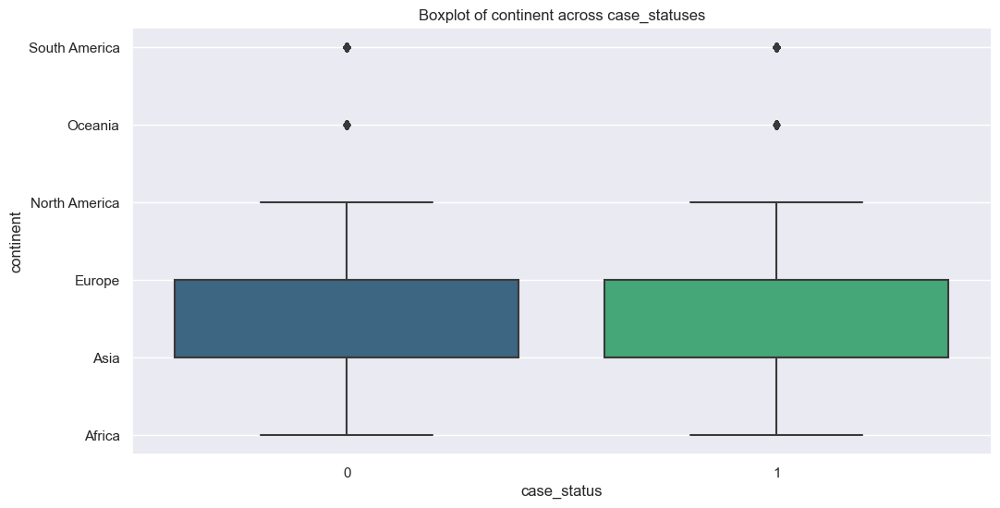

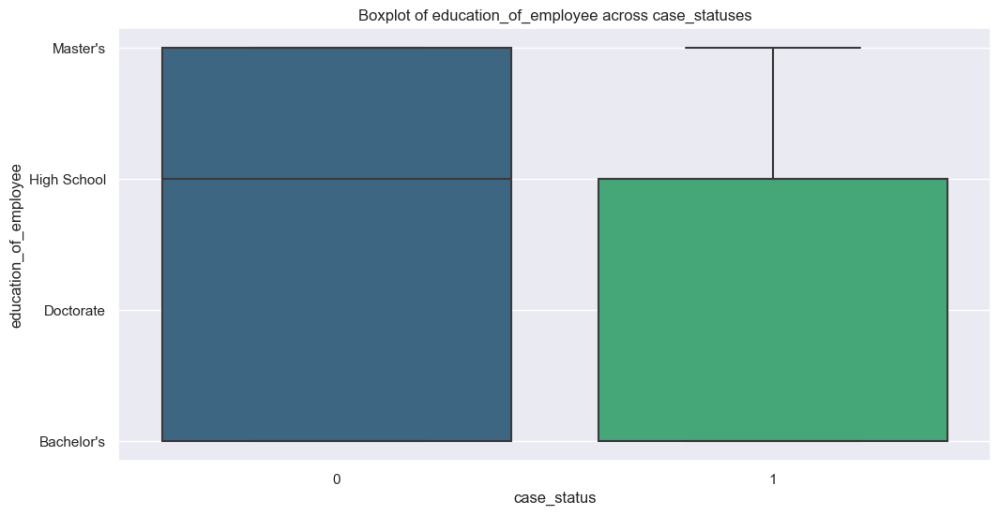

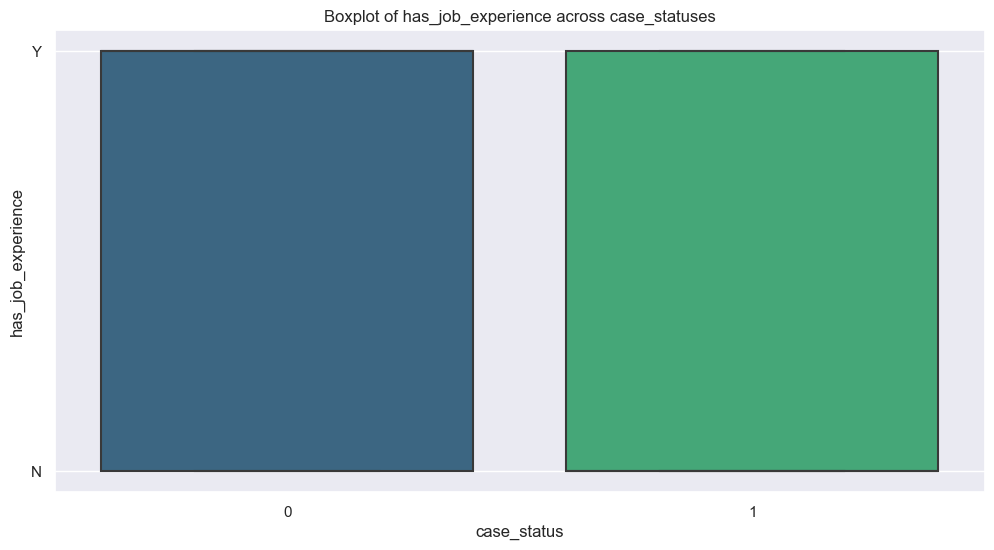

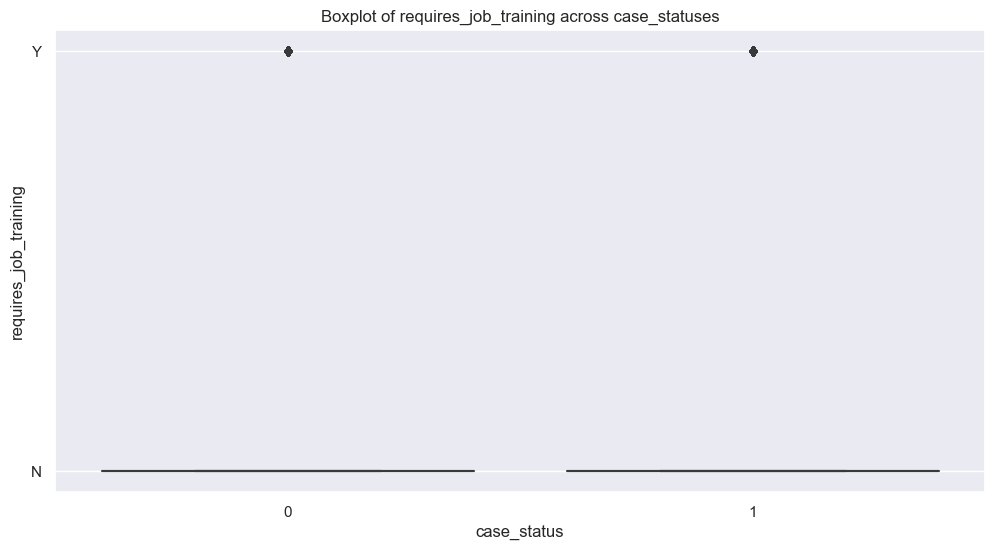

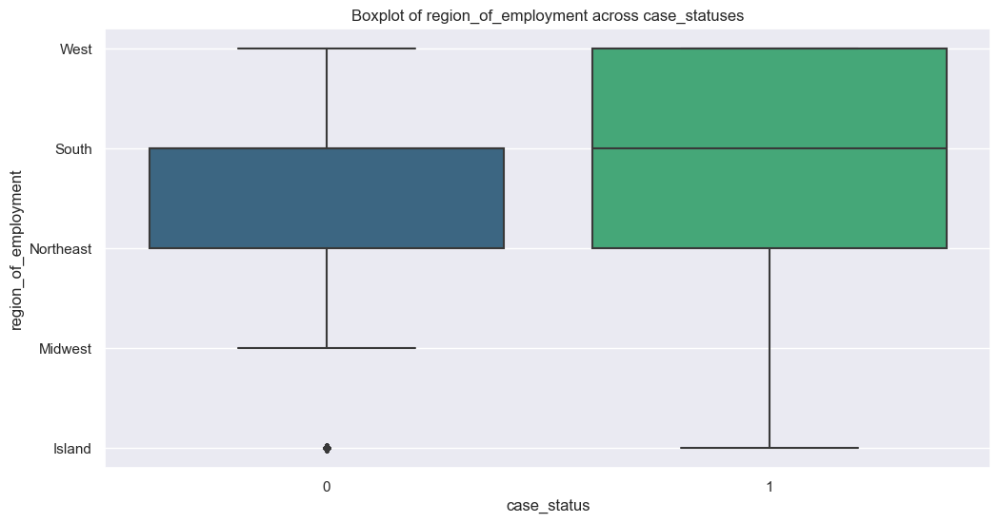

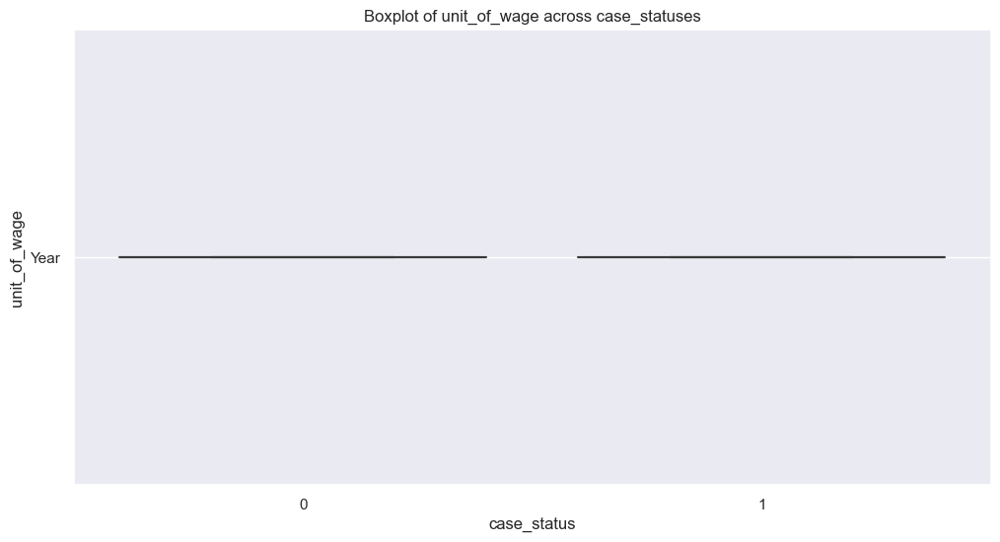

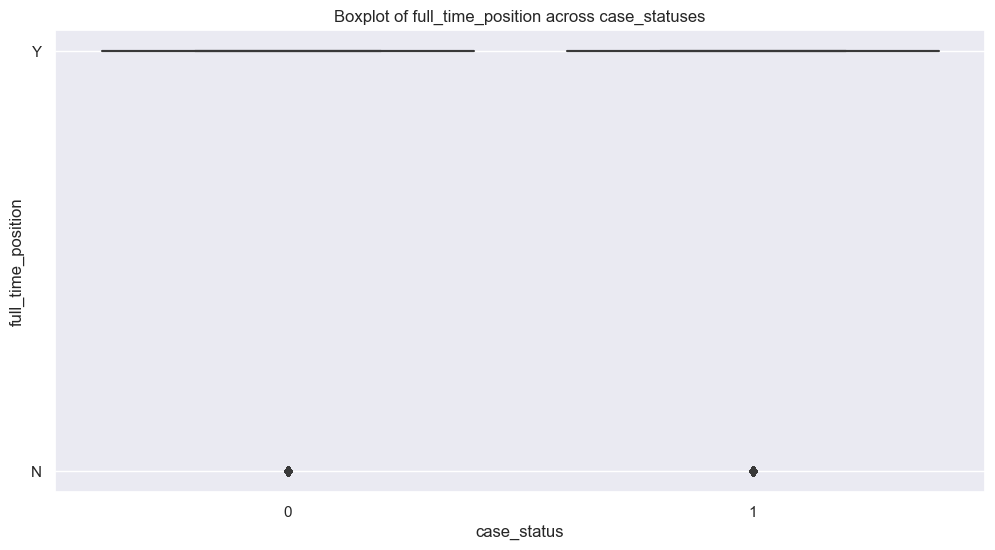

In [32]:

# # Create boxplot for each numeric column
# plt.figure(figsize=(12, 6))
# sns.boxplot(data=visa_df, x='case_status', y='case_id', palette='viridis')
# plt.title('Boxplot of case_id across case_statuses')
# plt.yticks(ticks=list(case_id_mapping.keys()), labels=list(case_id_mapping.values()))
# plt.show()


plt.figure(figsize=(12, 6))
sns.boxplot(data=visa_df, x='case_status', y='continent', palette='viridis')
plt.title('Boxplot of continent across case_statuses')
plt.yticks(ticks=list(continent_mapping.keys()), labels=list(continent_mapping.values()))
plt.show()


plt.figure(figsize=(12, 6))
sns.boxplot(data=visa_df, x='case_status', y='education_of_employee', palette='viridis')
plt.title('Boxplot of education_of_employee across case_statuses')
plt.yticks(ticks=list(education_mapping.keys()), labels=list(education_mapping.values()))
plt.show()


plt.figure(figsize=(12, 6))
sns.boxplot(data=visa_df, x='case_status', y='has_job_experience', palette='viridis')
plt.title('Boxplot of has_job_experience across case_statuses')
plt.yticks(ticks=list(job_experience_mapping.keys()), labels=list(job_experience_mapping.values()))
plt.show()


plt.figure(figsize=(12, 6))
sns.boxplot(data=visa_df, x='case_status', y='requires_job_training', palette='viridis')
plt.title('Boxplot of requires_job_training across case_statuses')
plt.yticks(ticks=list(job_training_mapping.keys()), labels=list(job_training_mapping.values()))
plt.show()


plt.figure(figsize=(12, 6))
sns.boxplot(data=visa_df, x='case_status', y='region_of_employment', palette='viridis')
plt.title('Boxplot of region_of_employment across case_statuses')
plt.yticks(ticks=list(region_mapping.keys()), labels=list(region_mapping.values()))
plt.show()


plt.figure(figsize=(12, 6))
sns.boxplot(data=visa_df, x='case_status', y='unit_of_wage', palette='viridis')
plt.title('Boxplot of unit_of_wage across case_statuses')
plt.yticks(ticks=list(wage_unit_mapping.keys()), labels=list(wage_unit_mapping.values()))
plt.show()


plt.figure(figsize=(12, 6))
sns.boxplot(data=visa_df, x='case_status', y='full_time_position', palette='viridis')
plt.title('Boxplot of full_time_position across case_statuses')
plt.yticks(ticks=list(full_time_mapping.keys()), labels=list(full_time_mapping.values()))
plt.show()


### Graph1

Case outcomes vary across regions, with some continents having more favorable cases than others.

The distribution of case outcomes differs significantly between regions.

Wealthier regions might have better resources and support systems, influencing case outcomes.

Immigration and legal policies vary across countries, affecting case processing and decisions.

Factors like education, employment rates, and access to legal aid can impact case success.

Understanding regional differences can help tailor policies, allocate resources, and improve the immigration process.

_________________________

### Graph 2

Individuals with higher education levels (Master's and Doctorate) seem more likely to achieve a "1" case status compared to those with lower education levels (High School and Bachelor's).

The boxes and median lines in the plot show higher education levels generally leaning towards the "1" category.

There is a wider range of case statuses for individuals with Master's degrees, indicated by the longer box and whiskers for this category.

This suggests that while Master's degree holders tend towards a "1" status, a significant portion still have "0" statuses.

Potential outliers may exist in the data, especially for the Master's category, as shown by individual data points outside the whiskers of the box plot.

__________

### Graph 3

Full-time positions vary significantly across regions.

The Northeast has the highest number of both available and unavailable full-time positions.

The West has a substantial number of full-time positions, making it the runner-up.

The South and Midwest have a moderate number of full-time positions, with the South having more available positions.

The Island region has the lowest number of full-time positions.

Economic conditions, industry types, and cost of living differences might influence the availability of full-time positions across regions.

### Graph 5

Case status (0 and 1) varies significantly across different regions of employment.

The Northeast has the highest number of cases, with many having a status of 1.

The West and South regions have a substantial number of cases, with more cases having a status of 1 compared to the Midwest and Island regions.

The Midwest and Island regions have fewer cases overall, with a more balanced distribution of case statuses.

Economic conditions might influence case statuses, with stronger economies potentially having more cases with a status of 1.

The types of industries and regional policies related to employment or case processing could impact case statuses.

Access to legal aid, support services, and information about the case process might vary across regions, affecting case outcomes.

### Graph 4, Graph 6 and Graph 7 have no clear interpretation

______________________________

______________________________

# Distribution of all the columns in the dataset


### All the features seem to normally distributed. Since we have multiple features, lets try to identify the distribution

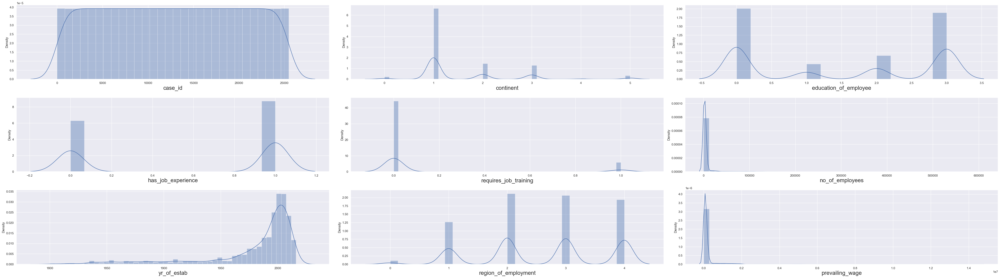

In [33]:
# let us now see the distribution of the dataset we have

plt.figure(figsize=(50,55), facecolor="white")
plotnumber = 1

for column in visa_df:
    if plotnumber <=9:
        ax = plt.subplot(12,3, plotnumber)
        sns.distplot(visa_df[column])
        plt.xlabel(column, fontsize=20)
    plotnumber+=1
plt.tight_layout()

## Correlation of the features with the dependent variable "case_status"

#### The "prevailing_wage" seems to have a weak correlation

In [34]:

corr_matrix = visa_df.corr()
corr_matrix["case_status"].sort_values(ascending=False)

case_status              1.000000
prevailing_wage          0.084993
region_of_employment     0.053490
continent                0.017606
full_time_position       0.012711
requires_job_training   -0.008423
yr_of_estab             -0.008597
no_of_employees         -0.008677
case_id                 -0.013230
education_of_employee   -0.100919
has_job_experience      -0.192162
unit_of_wage                  NaN
Name: case_status, dtype: float64

##### The value with the highest correlation to "case_status" is prevailing_wage.

##### It has a correlation coefficient of 0.084993, which indicates a weak positive correlation. While it's not a strong correlation, it's the highest among all the listed features.

___________

# Splitting up of dataset between x (features) and y (target column)

In [35]:
x = visa_df.drop(columns = ["case_status"], axis=1)
y = visa_df["case_status"]

# Check if the dataset is over sampling or under sampling

In [36]:
visa_df["case_status"].value_counts()

case_status
0    17018
1     8462
Name: count, dtype: int64

# I will proceed with SMOTE technique for Over Sampling of dataset
### Although very few amount of values are imbalanced, I would still consider it to be imbalanced dataset because, the accuracy of the model after balancing the dataset was much better than the unbalanced dataset.

In [37]:

SM = SMOTE()
x_over, y_over = SM.fit_resample(x,y)

## Balanced dataset after SMOTE

In [38]:
y_over.value_counts()

case_status
1    17018
0    17018
Name: count, dtype: int64

# split the dataset into train and test data set

#### I have chosed 200 random state and 30% of data is divided in text dataset

In [39]:
x_train, x_test, y_train, y_test = train_test_split(x_over, y_over, test_size=0.30, random_state = 200)

___________________________

_______________________________

# Model Building - Bagging

_______________________________

### 1) DecisionTreeClassifier

In [40]:
dTree = DecisionTreeClassifier()
dTree.fit(x_train,y_train)

y_pred_dt = dTree.predict(x_test)

print(accuracy_score(y_test, y_pred_dt))
print(confusion_matrix(y_test, y_pred_dt))
print(classification_report(y_test, y_pred_dt))

0.714719420233082
[[3560 1498]
 [1415 3738]]
              precision    recall  f1-score   support

           0       0.72      0.70      0.71      5058
           1       0.71      0.73      0.72      5153

    accuracy                           0.71     10211
   macro avg       0.71      0.71      0.71     10211
weighted avg       0.71      0.71      0.71     10211



In [41]:
print(dTree.score(x_train,y_train))
print(dTree.score(x_test,y_test))

1.0
0.714719420233082


### Visualizing the Decision Tree

In [42]:
import graphviz
from sklearn import tree

# Convert feature names and class names to strings
feature_names = list(map(str, x_train.columns))
class_names = list(map(str, y_train.unique()))

# Export the decision tree to DOT format
dot_data = tree.export_graphviz(dTree, 
                                feature_names=feature_names, 
                                class_names=class_names, 
                                filled=True, rounded=True,
                                special_characters=True)

# Visualize the tree
graph = graphviz.Source(dot_data)
#graph.render("credit_tree")

graph.view()
display(graph)

## Reducing overfitting (Regularization)

In [43]:
dTreeR = DecisionTreeClassifier(max_depth = 3, random_state=1)
dTreeR.fit(x_train,y_train)

y_pred_dtR = dTreeR.predict(x_test)

print(accuracy_score(y_test, y_pred_dtR))
print(confusion_matrix(y_test, y_pred_dtR))
print(classification_report(y_test, y_pred_dtR))

0.7192243658799334
[[3514 1544]
 [1323 3830]]
              precision    recall  f1-score   support

           0       0.73      0.69      0.71      5058
           1       0.71      0.74      0.73      5153

    accuracy                           0.72     10211
   macro avg       0.72      0.72      0.72     10211
weighted avg       0.72      0.72      0.72     10211



In [44]:
print(dTreeR.score(x_train,y_train))
print(dTreeR.score(x_test,y_test))

0.713788037775446
0.7192243658799334


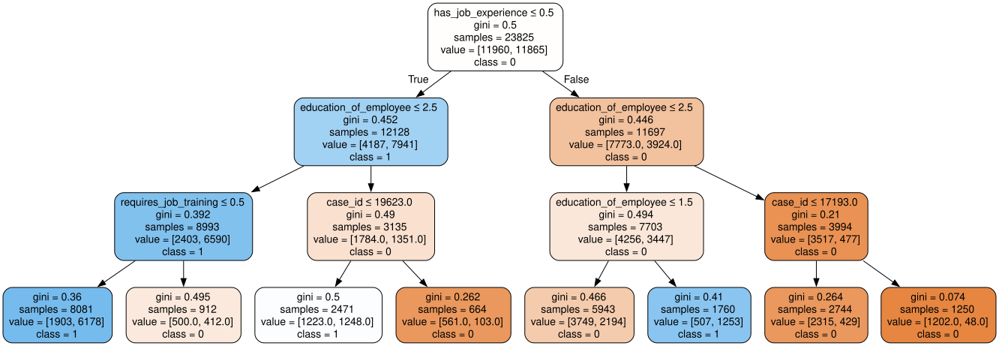

In [45]:
import graphviz
from sklearn import tree

# Convert feature names and class names to strings
feature_names = list(map(str, x_train.columns))
class_names = list(map(str, y_train.unique()))

# Export the decision tree to DOT format
dot_data = tree.export_graphviz(dTreeR, 
                                feature_names=feature_names, 
                                class_names=class_names, 
                                filled=True, rounded=True,
                                special_characters=True)

# Visualize the tree
graph = graphviz.Source(dot_data)
graph.render("credit_treeR")

graph.view()
display(graph)

In [46]:
# importance of features

print(pd.DataFrame(dTreeR.feature_importances_, columns = ["Imp"], index = x_train.columns))

                            Imp
case_id                0.053635
continent              0.000000
education_of_employee  0.461616
has_job_experience     0.428203
requires_job_training  0.056546
no_of_employees        0.000000
yr_of_estab            0.000000
region_of_employment   0.000000
prevailing_wage        0.000000
unit_of_wage           0.000000
full_time_position     0.000000


### 2) BaggingClassifier

In [47]:
bgcl = BaggingClassifier(estimator=dTree, n_estimators=50, random_state=1)
# bgcl = BaggingClassifier(n_estimators=50, random_state=1)

bgcl = bgcl.fit(x_train, y_train)

0.7736754480462247


<Axes: >

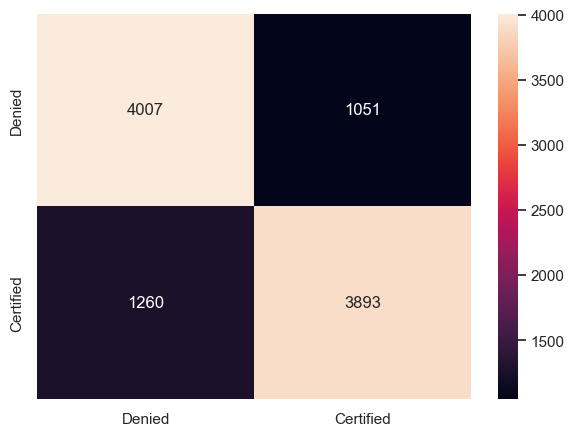

In [48]:

y_pred_bag = bgcl.predict(x_test)

print(bgcl.score(x_test, y_test))

cm = confusion_matrix(y_test, y_pred_bag, labels=[0, 1])

df_cm = pd.DataFrame(cm, index=[i for i in ["Denied", "Certified"]],
                     columns=[i for i in ["Denied", "Certified"]])

plt.figure(figsize=(7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

______________________

### 3) RandomForestClassifier

In [49]:

rf = RandomForestClassifier()
rf.fit(x_train,y_train)

y_pred_rf = rf.predict(x_test)

print(accuracy_score(y_test, y_pred_rf))
print(confusion_matrix(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))

0.7831750073450201
[[4052 1006]
 [1208 3945]]
              precision    recall  f1-score   support

           0       0.77      0.80      0.79      5058
           1       0.80      0.77      0.78      5153

    accuracy                           0.78     10211
   macro avg       0.78      0.78      0.78     10211
weighted avg       0.78      0.78      0.78     10211



In [50]:
# Evaluate models
metrics = {
    "Model": ["Decision Tree", "Bagging", "Random Forest"],
    "Accuracy": [
        accuracy_score(y_test, y_pred_dt),
        accuracy_score(y_test, y_pred_bag),
        accuracy_score(y_test, y_pred_rf)
    ],
    "ROC-AUC": [
        roc_auc_score(y_test, dTree.predict_proba(x_test)[:, 1]),
        roc_auc_score(y_test, bgcl.predict_proba(x_test)[:, 1]),
        roc_auc_score(y_test, rf.predict_proba(x_test)[:, 1])
    ]
}

metrics_df = pd.DataFrame(metrics)
print(metrics_df)

# Print classification reports for detailed metrics
print("Decision Tree Classification Report:\n", classification_report(y_test, y_pred_dt))
print("Bagging Classification Report:\n", classification_report(y_test, y_pred_bag))
print("Random Forest Classification Report:\n", classification_report(y_test, y_pred_rf))

           Model  Accuracy   ROC-AUC
0  Decision Tree  0.714719  0.714619
1        Bagging  0.773675  0.863080
2  Random Forest  0.783175  0.866620
Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.70      0.71      5058
           1       0.71      0.73      0.72      5153

    accuracy                           0.71     10211
   macro avg       0.71      0.71      0.71     10211
weighted avg       0.71      0.71      0.71     10211

Bagging Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.79      0.78      5058
           1       0.79      0.76      0.77      5153

    accuracy                           0.77     10211
   macro avg       0.77      0.77      0.77     10211
weighted avg       0.77      0.77      0.77     10211

Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.80  

__________________

# Model Improvement - Bagging

In [51]:
# Define hyperparameter grids
dt_param_dist = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 5, 10]
}

bagging_param_dist = {
    'n_estimators': [50, 100, 200],
    'max_samples': [0.5, 0.7, 1.0],
    'max_features': [0.5, 0.7, 1.0]
}

rf_param_dist = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 5, 10],
    'max_features': ['auto', 'sqrt', 'log2']
}


In [52]:
dt_random_search = RandomizedSearchCV(estimator=dTree, param_distributions=dt_param_dist, n_iter=50, cv=3, scoring='roc_auc', n_jobs=-1, random_state=42)
bagging_random_search = RandomizedSearchCV(estimator=bgcl, param_distributions=bagging_param_dist, n_iter=50, cv=3, scoring='roc_auc', n_jobs=-1, random_state=42)
rf_random_search = RandomizedSearchCV(estimator=rf, param_distributions=rf_param_dist, n_iter=50, cv=3, scoring='roc_auc', n_jobs=-1, random_state=42)

In [53]:
# Fit Grid Search
dt_random_search.fit(x_train, y_train)
bagging_random_search.fit(x_train, y_train)
rf_random_search.fit(x_train, y_train)

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=50,
                   n_jobs=-1,
                   param_distributions={'max_depth': [None, 10, 20, 30],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 5, 10],
                                        'min_samples_split': [2, 10, 20],
                                        'n_estimators': [50, 100, 200]},
                   random_state=42, scoring='roc_auc')

In [54]:

# Get best models
best_dt = dt_random_search.best_estimator_
best_bagging = bagging_random_search.best_estimator_
best_rf = rf_random_search.best_estimator_

In [55]:
# Predict on test set
y_pred_dt = best_dt.predict(x_test)
y_pred_bagging = best_bagging.predict(x_test)
y_pred_rf = best_rf.predict(x_test)

In [56]:


# Evaluate tuned models
metrics = {
    "Model": ["Tuned Decision Tree", "Tuned Bagging", "Tuned Random Forest"],
    "Accuracy": [
        accuracy_score(y_test, y_pred_dt),
        accuracy_score(y_test, y_pred_bagging),
        accuracy_score(y_test, y_pred_rf)
    ],
    "ROC-AUC": [
        roc_auc_score(y_test, best_dt.predict_proba(x_test)[:, 1]),
        roc_auc_score(y_test, best_bagging.predict_proba(x_test)[:, 1]),
        roc_auc_score(y_test, best_rf.predict_proba(x_test)[:, 1])
    ]
}

metrics_df = pd.DataFrame(metrics)
print(metrics_df)

# Print classification reports for detailed metrics
print("Tuned Decision Tree Classification Report:\n", classification_report(y_test, y_pred_dt))
print("Tuned Bagging Classification Report:\n", classification_report(y_test, y_pred_bagging))
print("Tuned Random Forest Classification Report:\n", classification_report(y_test, y_pred_rf))

                 Model  Accuracy   ROC-AUC
0  Tuned Decision Tree  0.751836  0.835013
1        Tuned Bagging  0.796690  0.875092
2  Tuned Random Forest  0.784154  0.867697
Tuned Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.78      0.76      5058
           1       0.77      0.73      0.75      5153

    accuracy                           0.75     10211
   macro avg       0.75      0.75      0.75     10211
weighted avg       0.75      0.75      0.75     10211

Tuned Bagging Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.81      0.80      5058
           1       0.81      0.79      0.80      5153

    accuracy                           0.80     10211
   macro avg       0.80      0.80      0.80     10211
weighted avg       0.80      0.80      0.80     10211

Tuned Random Forest Classification Report:
               precision    recall  f1-score   su

____________________

# Model Building - Boosting


_________________

### 1) AdaBoostClassifier

0.7208892370972481


<Axes: >

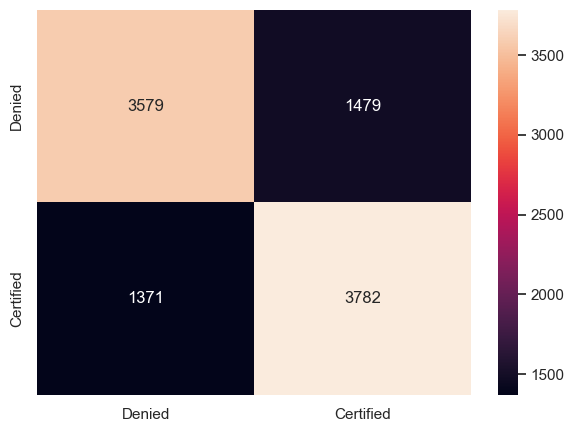

In [57]:

abcl = AdaBoostClassifier(estimator=dTree, n_estimators=50, random_state=1)
abcl.fit(x_train, y_train)

y_pred_ada = abcl.predict(x_test)
print(abcl.score(x_test, y_test))

cm = confusion_matrix(y_test, y_pred_ada, labels=[0, 1])

df_cm = pd.DataFrame(cm, index=[i for i in ["Denied", "Certified"]],
                     columns=[i for i in ["Denied", "Certified"]])

plt.figure(figsize=(7,5))
sns.heatmap(df_cm, annot=True, fmt='g')


______________________________

### 2) GradientBoostingClassifier

0.7474292429732641


<Axes: >

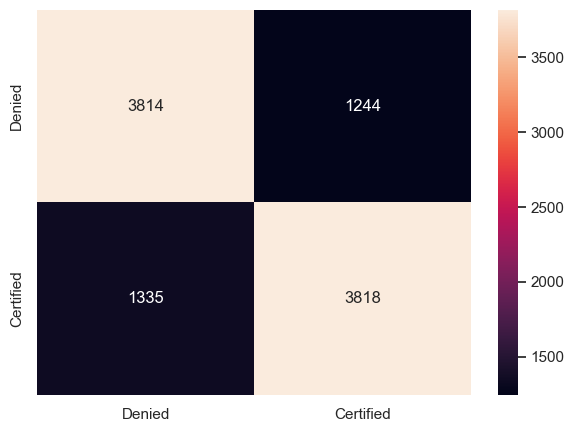

In [58]:

gbcl = GradientBoostingClassifier(n_estimators=50, random_state=1)
gbcl.fit(x_train, y_train)

y_pred_gb = gbcl.predict(x_test)
print(gbcl.score(x_test, y_test))

cm = confusion_matrix(y_test, y_pred_gb, labels=[0, 1])

df_cm = pd.DataFrame(cm, index=[i for i in ["Denied", "Certified"]],
                     columns=[i for i in ["Denied", "Certified"]])

plt.figure(figsize=(7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

In [59]:
# Evaluate models
metrics = {
    "Model": ["AdaBoostClassifier", "GradientBoostingClassifier"],
    "Accuracy": [
        accuracy_score(y_test, y_pred_ada),
        accuracy_score(y_test, y_pred_gb)
    ],
    "ROC-AUC": [
        roc_auc_score(y_test, abcl.predict_proba(x_test)[:, 1]),
        roc_auc_score(y_test, gbcl.predict_proba(x_test)[:, 1])
    ]
}

metrics_df = pd.DataFrame(metrics)
print(metrics_df)

# Print classification reports for detailed metrics
print("AdaBoostClassifier:\n", classification_report(y_test, y_pred_ada))
print("GradientBoostingClassifier:\n", classification_report(y_test, y_pred_gb))

                        Model  Accuracy   ROC-AUC
0          AdaBoostClassifier  0.720889  0.720767
1  GradientBoostingClassifier  0.747429  0.827453
AdaBoostClassifier:
               precision    recall  f1-score   support

           0       0.72      0.71      0.72      5058
           1       0.72      0.73      0.73      5153

    accuracy                           0.72     10211
   macro avg       0.72      0.72      0.72     10211
weighted avg       0.72      0.72      0.72     10211

GradientBoostingClassifier:
               precision    recall  f1-score   support

           0       0.74      0.75      0.75      5058
           1       0.75      0.74      0.75      5153

    accuracy                           0.75     10211
   macro avg       0.75      0.75      0.75     10211
weighted avg       0.75      0.75      0.75     10211



# Model Improvement - Boosting

0.7266673195573401


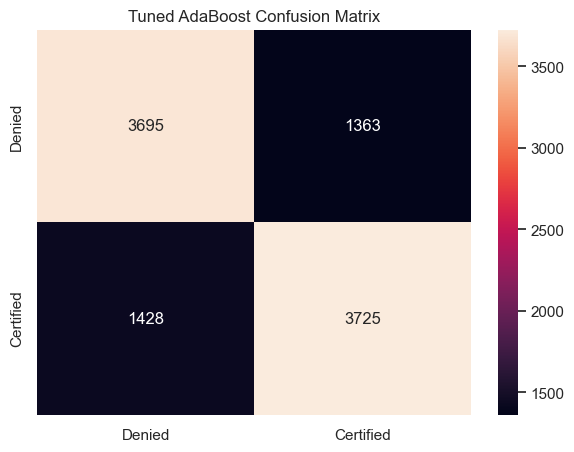

In [60]:
# Define the parameter grid for AdaBoost
param_grid_ada = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1, 10]
}

# Initialize the base estimator
base_estimator = DecisionTreeClassifier(max_depth=1, random_state=1)

# Initialize the AdaBoost model
abcl = AdaBoostClassifier(estimator=base_estimator, random_state=1)

# Perform Randomized Search with cross-validation
random_search_ada = RandomizedSearchCV(estimator=abcl, param_distributions=param_grid_ada, n_iter=50, cv=3, scoring='roc_auc', n_jobs=-1, random_state=1)
random_search_ada.fit(x_train, y_train)


# Get the best estimator
best_ada = random_search_ada.best_estimator_

# Predict and evaluate the tuned AdaBoost model
y_pred_ada_tuned = best_ada.predict(x_test)
print(best_ada.score(x_test, y_test))



cm_ada_tuned = confusion_matrix(y_test, y_pred_ada_tuned, labels=[0, 1])
df_cm_ada_tuned = pd.DataFrame(cm_ada_tuned, index=[i for i in ["Denied", "Certified"]],
                     columns=[i for i in ["Denied", "Certified"]])

plt.figure(figsize=(7, 5))
sns.heatmap(df_cm_ada_tuned, annot=True, fmt='g')
plt.title("Tuned AdaBoost Confusion Matrix")
plt.show()

Tuned Gradient Boosting Score: 0.7714229752227989


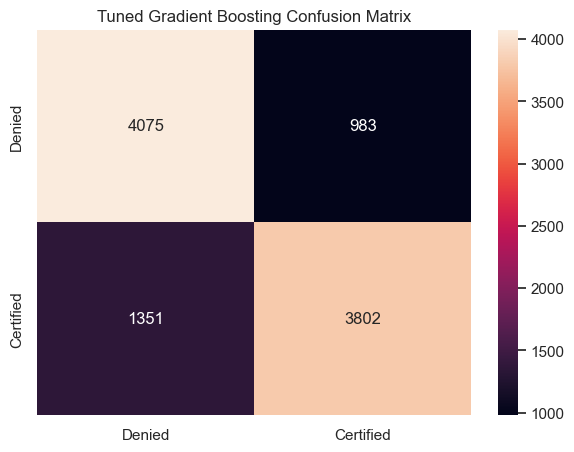

In [61]:
param_grid_gb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1, 10],
    'max_depth': [1, 2, 3, 4, 5],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 5, 10]
}

# Initialize the Gradient Boosting model
gb = GradientBoostingClassifier(random_state=1)

# Perform Randomized Search with cross-validation
random_search_gb = RandomizedSearchCV(estimator=gb, param_distributions=param_grid_gb, n_iter=50, cv=3, scoring='roc_auc', n_jobs=-1, random_state=1)
random_search_gb.fit(x_train, y_train)

# Get the best estimator
best_gb = random_search_gb.best_estimator_

# Predict and evaluate the tuned Gradient Boosting model
y_pred_gb_tuned = best_gb.predict(x_test)
print(f"Tuned Gradient Boosting Score: {best_gb.score(x_test, y_test)}")

cm_gb_tuned = confusion_matrix(y_test, y_pred_gb_tuned, labels=[0, 1])
df_cm_gb_tuned = pd.DataFrame(cm_gb_tuned, index=["Denied", "Certified"],
                              columns=["Denied", "Certified"])

plt.figure(figsize=(7, 5))
sns.heatmap(df_cm_gb_tuned, annot=True, fmt='g')
plt.title("Tuned Gradient Boosting Confusion Matrix")
plt.show()

In [62]:
# Evaluate models
metrics = {
    "Model": ["AdaBoostClassifier", "GradientBoostingClassifier"],
    "Accuracy": [
        accuracy_score(y_test, y_pred_ada_tuned),
        accuracy_score(y_test, y_pred_gb_tuned)
    ],
    "ROC-AUC": [
        roc_auc_score(y_test, random_search_ada.predict_proba(x_test)[:, 1]),
        roc_auc_score(y_test, random_search_gb.predict_proba(x_test)[:, 1])
    ]
}

metrics_df = pd.DataFrame(metrics)
print(metrics_df)

# Print classification reports for detailed metrics
print("AdaBoostClassifier:\n", classification_report(y_test, y_pred_ada_tuned))
print("GradientBoostingClassifier:\n", classification_report(y_test, y_pred_gb_tuned))

                        Model  Accuracy   ROC-AUC
0          AdaBoostClassifier  0.726667  0.802996
1  GradientBoostingClassifier  0.771423  0.860015
AdaBoostClassifier:
               precision    recall  f1-score   support

           0       0.72      0.73      0.73      5058
           1       0.73      0.72      0.73      5153

    accuracy                           0.73     10211
   macro avg       0.73      0.73      0.73     10211
weighted avg       0.73      0.73      0.73     10211

GradientBoostingClassifier:
               precision    recall  f1-score   support

           0       0.75      0.81      0.78      5058
           1       0.79      0.74      0.77      5153

    accuracy                           0.77     10211
   macro avg       0.77      0.77      0.77     10211
weighted avg       0.77      0.77      0.77     10211



________________________

# Actionable Insights & Recommendations

### Bagging

#### BaggingClassifier (tuned)

Based on the outputs, the Tuned Bagging model appears to be the best performer.

Highest Accuracy and ROC-AUC: Among all models, Tuned Bagging exhibits the highest accuracy and ROC-AUC scores, indicating its superior predictive performance and ability to distinguish between classes.

Balanced Classification Report: The classification report for Tuned Bagging shows well-balanced precision, recall, and F1-score values for both classes (0 and 1), suggesting that the model effectively handles both positive and negative cases without significant bias.




Tuned Random Forest: While close in performance, Tuned Bagging slightly outperforms Tuned Random Forest in terms of accuracy and ROC-AUC.

Decision Tree and Bagging: The base Decision Tree and Bagging models show lower performance compared to their tuned counterparts, highlighting the importance of hyperparameter tuning.

### Boosting

#### GradientBoostingClassifier (tuned)

Based on the outputs, the GradientBoostingClassifier (tuned) would be the best model.

Accuracy and ROC-AUC: The tuned GradientBoostingClassifier has the highest accuracy (0.771423) and ROC-AUC (0.860015) values among all models. This indicates better overall performance and better ability to distinguish between positive and negative classes.

Precision, Recall, and F1-score: While all models have comparable precision, recall, and F1-scores, the tuned GradientBoostingClassifier generally shows slightly better performance in these metrics across both classes.

Weighted Average: The weighted average for accuracy, precision, recall, and F1-score is also higher for the tuned GradientBoostingClassifier, suggesting better overall performance considering the class imbalance.

In summary, the tuned GradientBoostingClassifier demonstrates superior performance in terms of accuracy, ROC-AUC, and overall metric scores, making it the preferred choice among the models presented.

#### Conclude with the key takeaways for the business

Company can focus more from Asian region as the employees are in large number.

The companies in the Southern region (Probably Texas etc.) have higher visa approval chances. The local / state government policies may be in favour as there is demand for workforce.

It would be wise to target audience who prefer "perm employment" over other type of jobs. Most of Asian people do not prefer contarct positions unlike the european and American work culture.

Hiring candidate with atleaset Masters degree would be ideal. Educate employees not only bring in more mney but also mean they may be less of a liability when it comes to immigrating to USA.